# Introduction

We downloaded the dataset from Kaggle. This dataset contains information about almost all terrorism activities from 1970 to 2017 around the world.

The purpose of this project is to understand the characteristics or patterns of global terrorism and present them by multiple data visualization methods. We conducted the following analysis:

- time trend of the terrorists attacks over the world and top terrorism countries ？？
- identify the most attacked countries and the most active terrorist groups
- terrorism in United States

We used logistic regression, Random Forest and SVM models to predict the chances of success for a potential terrorist attack.

# Data preprocessing

## Data clean

In [6]:
import numpy as np
import pandas as pd

In [7]:
# read raw data
datafile = "global.csv"
raw_data = pd.read_csv(datafile, sep=',', engine='python')

In [8]:
df = raw_data[['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'motive', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'success', 'suicide',
       'attacktype1', 'attacktype1_txt', 'targtype1', 'targtype1_txt',
       'targsubtype1', 'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt',
       'gname', 'guncertain1', 'weaptype1', 'weaptype1_txt', 'weapsubtype1',
       'weapsubtype1_txt', 'nkill', 'nwound', 'ishostkid', 'dbsource',
       'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY', 'individual']]

In [9]:
# drop null records
df = df.dropna(axis=0,how='all')

# drop nonsense date rows
df = df[df['iday']>=1]
df = df[df['iday']<=31]
df = df[df['imonth']<=12]
df = df[df['imonth']>=1]

# drop unclear unknown weapon type, unknown attack type, unknown target type
df = df[df['weaptype1']!=13]
df = df[df['targtype1']!=20]
df = df[df['attacktype1']!=9]

In [10]:
# the remaning proportion
len(df), len(df) / len(raw_data)

(160168, 0.8815406376760544)

## Data reprensentation

### columns illustration

In [11]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'motive', 'provstate', 'city',
       'latitude', 'longitude', 'specificity', 'vicinity', 'success',
       'suicide', 'attacktype1', 'attacktype1_txt', 'targtype1',
       'targtype1_txt', 'targsubtype1', 'targsubtype1_txt', 'target1',
       'natlty1', 'natlty1_txt', 'gname', 'guncertain1', 'weaptype1',
       'weaptype1_txt', 'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY',
       'individual'],
      dtype='object')

### category illustration

In [12]:
df['weaptype1_txt'].unique()

array(['Firearms', 'Explosives', 'Incendiary', 'Chemical', 'Melee',
       'Sabotage Equipment',
       'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
       'Fake Weapons', 'Radiological', 'Other', 'Biological'],
      dtype=object)

In [13]:
df['attacktype1_txt'].unique()

array(['Armed Assault', 'Assassination', 'Bombing/Explosion',
       'Facility/Infrastructure Attack', 'Hijacking',
       'Hostage Taking (Kidnapping)', 'Unarmed Assault',
       'Hostage Taking (Barricade Incident)'], dtype=object)

In [14]:
df['targtype1_txt'].unique()

array(['Police', 'Utilities', 'Military', 'Government (General)',
       'Airports & Aircraft', 'Business', 'Educational Institution',
       'Violent Political Party', 'Government (Diplomatic)',
       'Private Citizens & Property', 'Religious Figures/Institutions',
       'Transportation', 'Tourists', 'NGO', 'Telecommunication',
       'Food or Water Supply', 'Terrorists/Non-State Militia', 'Other',
       'Journalists & Media', 'Maritime', 'Abortion Related'],
      dtype=object)

In [15]:
df['gname'].unique()

array(['Black Nationalists', 'Tupamaros (Uruguay)', 'Unknown', ...,
       'Fatoni Warriors', 'Minorities of Metropolitan Attacks',
       'Baloch Republican Party'], dtype=object)

# Data analysis & Visualization

In [48]:
import os
import codecs
import io
import folium
import base64
import warnings
import folium.plugins
from matplotlib import animation,rc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
from mpl_toolkits.basemap import Basemap
from IPython.display import HTML, display
from scipy.misc import imread
from subprocess import check_output
from bokeh.plotting import figure, output_file, show
import nltk
from wordcloud import WordCloud, STOPWORDS

py.init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
# os.environ['PROJ_LIB'] = 'C:/Users/hm-wa14/Anaconda3/pkgs/proj4-4.9.3-vc14_5/Library/share'

## Animation of Terrorist Activities

MovieWriter imagemagick unavailable. Trying to use pillow instead.



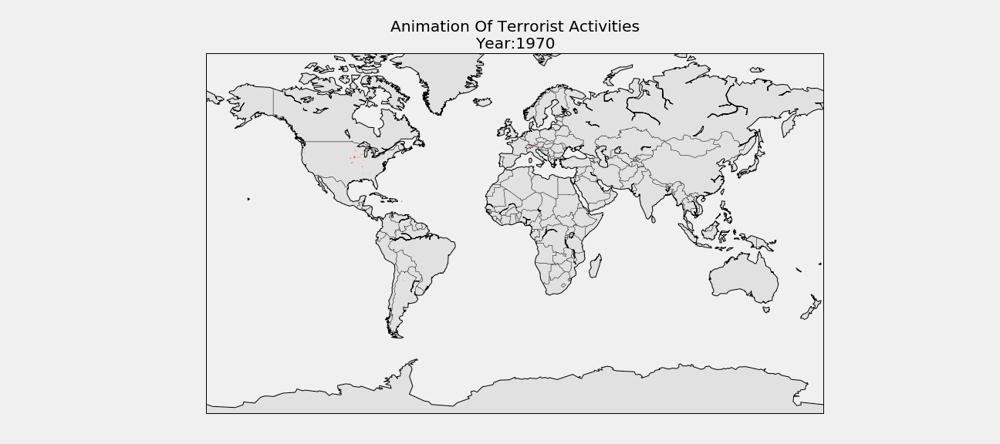

In [15]:
fig = plt.figure(figsize = (18,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    m6 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat6=list(df[df['iyear']==Year].latitude)
    long6=list(df[df['iyear']==Year].longitude)
    x6,y6=m6(long6,lat6)
    m6.scatter(x6, y6,s=[(kill+wound)*0.1 for kill,wound in zip(df[df['iyear']==Year].nkill,df[df['iyear']==Year].nwound)],color = 'r')
    m6.drawcoastlines()
    m6.drawcountries()
    m6.fillcontinents(zorder = 1,alpha=0.4)
    m6.drawmapboundary()
ani = animation.FuncAnimation(fig,animate,list(df.iyear.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

## Top Terrorism Countires

### #1 Iraq

MovieWriter imagemagick unavailable. Trying to use pillow instead.



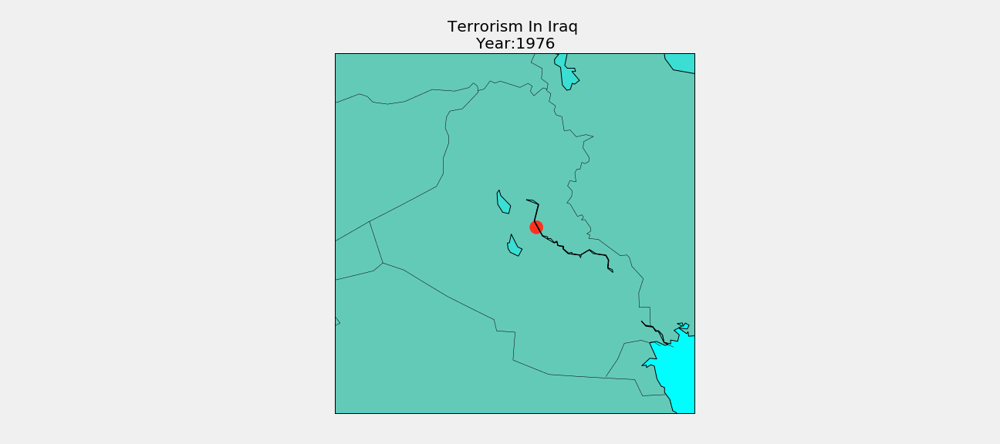

In [16]:
#data in Iraq
terr_ir=df[df['country_txt']=='Iraq']
terr_ir_fol=terr_ir.copy()
terr_ir_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_ir_fol[['latitude','longitude']]
city_ind=terr_ir_fol['city']
killed_ind=terr_ir_fol['nkill']
wound_ind=terr_ir_fol['nwound']
target_ind=terr_ir_fol['targtype1_txt']

# how did it spread in india
fig = plt.figure(figsize = (18,8))
def animate1(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Iraq '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=38,llcrnrlat=28,urcrnrlon=50,urcrnrlat=38,lat_0=33.2,lon_0=43.6)
    lat_gif=list(terr_ir[terr_ir['iyear']==Year].latitude)
    long_gif=list(terr_ir[terr_ir['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_ir[terr_ir['iyear']==Year].nkill,terr_ir[terr_ir['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate1,list(terr_ir['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

### #2 Pakistan

MovieWriter imagemagick unavailable. Trying to use pillow instead.



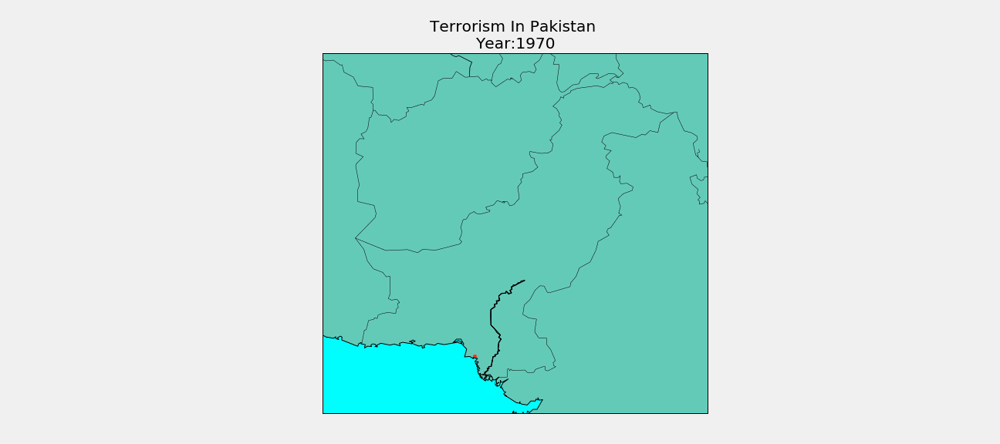

In [17]:
#data in Pakistan
terr_pa=df[df['country_txt']=='Pakistan']
terr_pa_fol=terr_ir.copy()
terr_pa_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_pa_fol[['latitude','longitude']]
city_ind=terr_pa_fol['city']
killed_ind=terr_pa_fol['nkill']
wound_ind=terr_pa_fol['nwound']
target_ind=terr_pa_fol['targtype1_txt']

# how did it spread in india
fig = plt.figure(figsize = (18,8))
def animate1(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Pakistan '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=60,llcrnrlat=22,urcrnrlon=80,urcrnrlat=38,lat_0=33.4,lon_0=69.34)
    lat_gif=list(terr_pa[terr_pa['iyear']==Year].latitude)
    long_gif=list(terr_pa[terr_pa['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_pa[terr_pa['iyear']==Year].nkill,terr_pa[terr_pa['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate1,list(terr_pa['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

### #3 Afghanistan

MovieWriter imagemagick unavailable. Trying to use pillow instead.



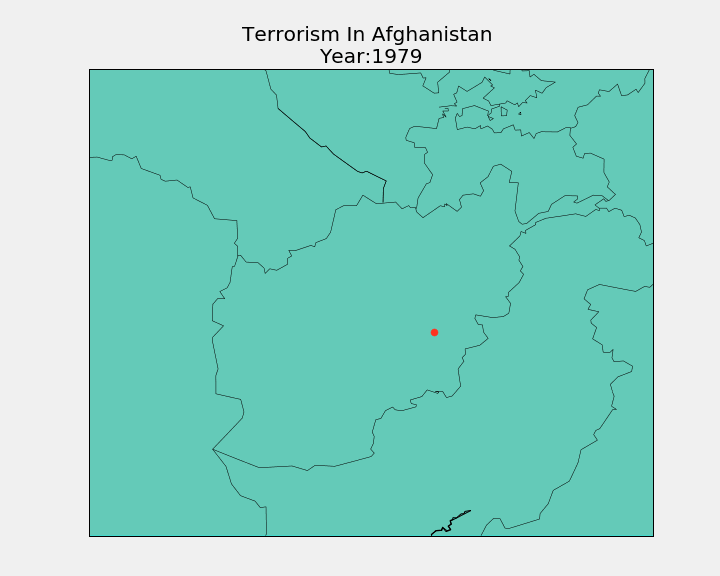

In [47]:
terr_af=df[df['country_txt']=='Afghanistan']
terr_af_fol=terr_af.copy()
terr_af_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_af_fol[['latitude','longitude']]
city_ind=terr_af_fol['city']
killed_ind=terr_af_fol['nkill']
wound_ind=terr_af_fol['nwound']
target_ind=terr_af_fol['targtype1_txt']

fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Afghanistan '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=57,llcrnrlat=27,urcrnrlon=77,urcrnrlat=41,lat_0=35,lon_0=68)
    lat_gif=list(terr_af[terr_af['iyear']==Year].latitude)
    long_gif=list(terr_af[terr_af['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_af[terr_af['iyear']==Year].nkill,terr_af[terr_af['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate,list(terr_af['iyear'].unique()), interval = 1500)    
ani.save('animation-af.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation-af.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''< img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

### #4 India

MovieWriter imagemagick unavailable. Trying to use pillow instead.



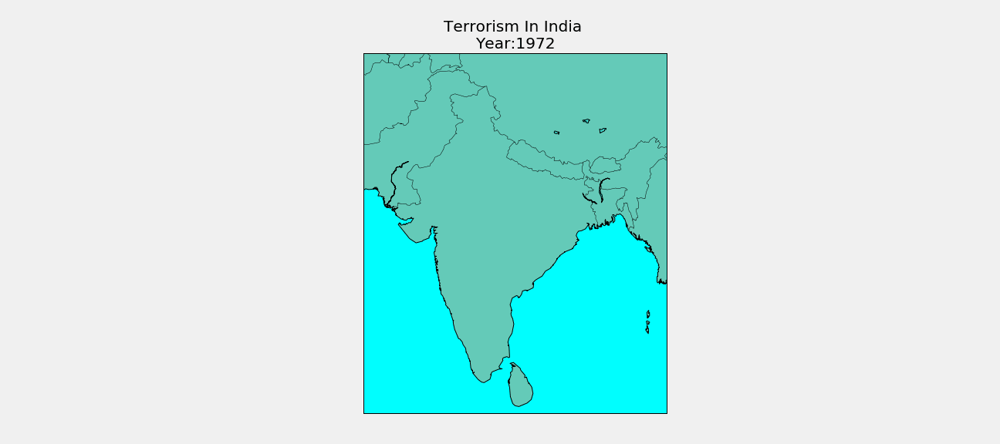

In [19]:
terr_india=df[df['country_txt']=='India']
terr_india_fol=terr_india.copy()
terr_india_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_india_fol[['latitude','longitude']]
city_ind=terr_india_fol['city']
killed_ind=terr_india_fol['nkill']
wound_ind=terr_india_fol['nwound']
target_ind=terr_india_fol['targtype1_txt']

fig = plt.figure(figsize = (18,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In India '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=67,llcrnrlat=5,urcrnrlon=99,urcrnrlat=37,lat_0=28,lon_0=77)
    lat_gif=list(terr_india[terr_india['iyear']==Year].latitude)
    long_gif=list(terr_india[terr_india['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_india[terr_india['iyear']==Year].nkill,terr_india[terr_india['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate,list(terr_india['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

## Motive wordcloud

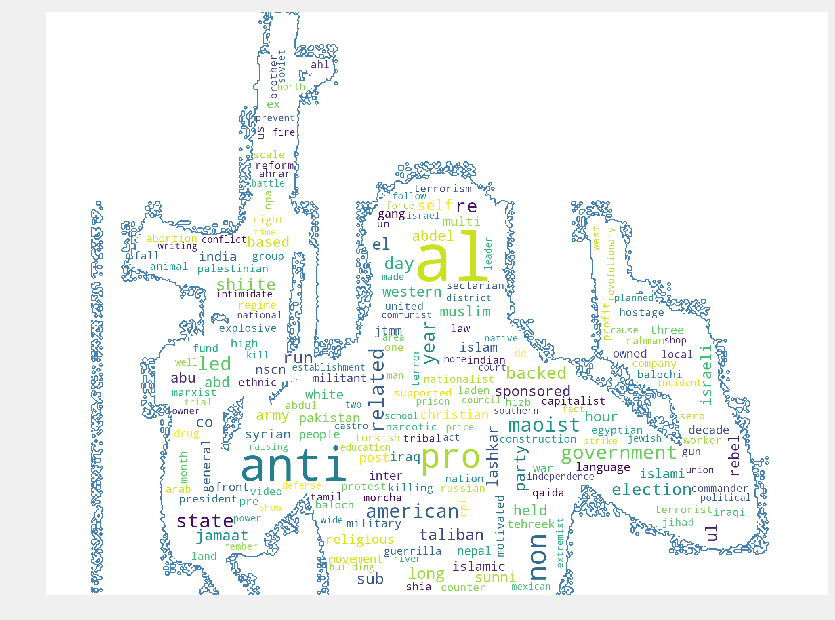

In [20]:
motive=df['motive'].str.lower().str.cat(sep=' ')
words=nltk.tokenize.word_tokenize(motive)
word_dist = nltk.FreqDist(words)
stopwords = nltk.corpus.stopwords.words('english')
words_without_stop = nltk.FreqDist(w for w in words if w not in stopwords) 

origin_mask = imread("terr.png")

wc = WordCloud(stopwords=STOPWORDS,background_color='white',mask=origin_mask, contour_width=3, 
               contour_color='steelblue').generate(" ".join(words_without_stop))
plt.imshow(wc)
fig=plt.gcf()
fig.set_size_inches(15,10)
plt.axis('off')
plt.show()

## Terrorist attacks overview

### Terrorist attacks by year

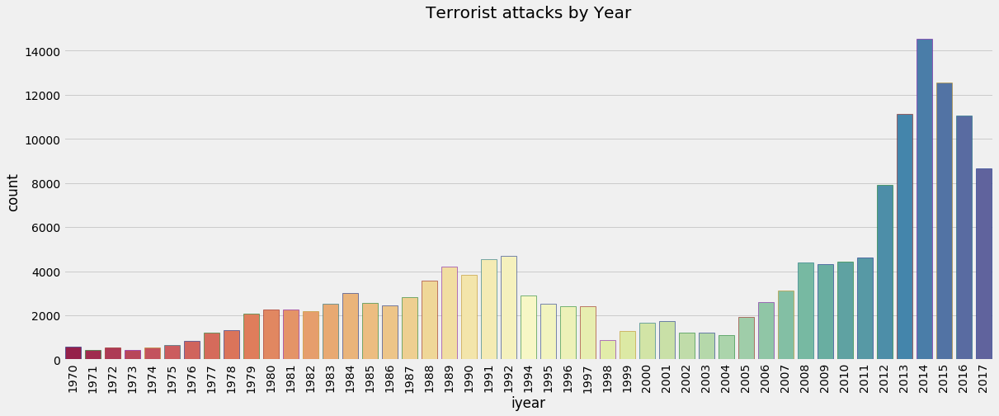

In [21]:
plt.subplots(figsize=(18,7))
sns.countplot('iyear',data=df,palette='Spectral',edgecolor=sns.color_palette('dark',8))
plt.xticks(rotation=90)
plt.title('Terrorist attacks by Year')
plt.show()

### Terrorist attacks by region 

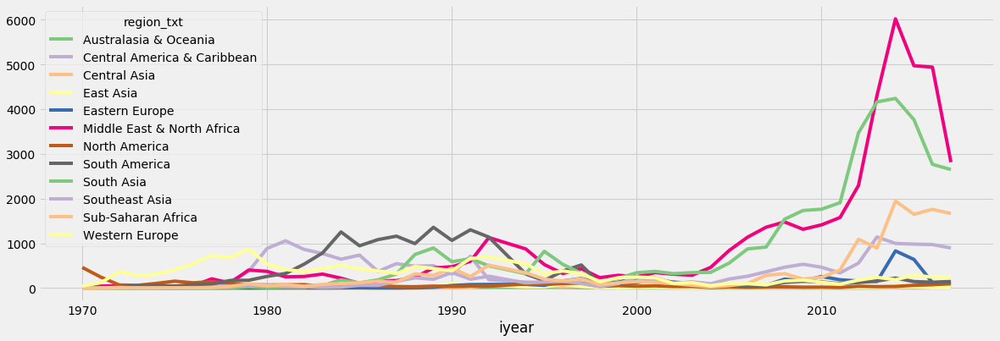

In [22]:
#region vs year
terror_region=pd.crosstab(df.iyear, df.region_txt)
terror_region.plot(color=sns.color_palette('Accent',12))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

## Terrorist attacks by target type

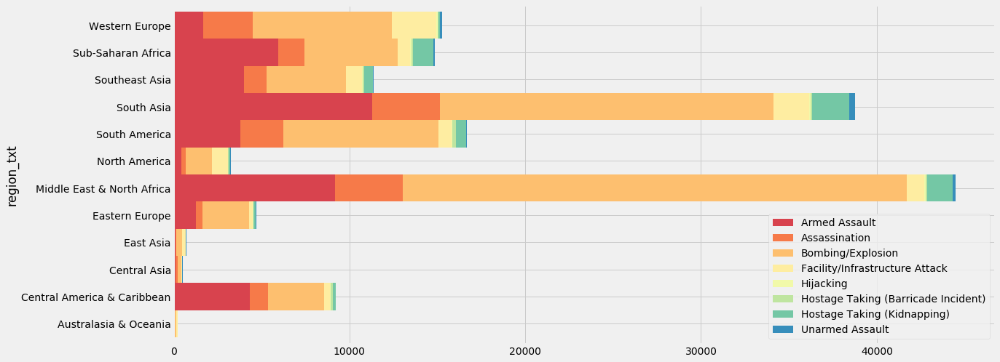

In [23]:
# attack type vs region
pd.crosstab(df.region_txt,df.attacktype1_txt).plot.barh(stacked=True,width=1,color=sns.color_palette('Spectral',8))
fig=plt.gcf()
fig.set_size_inches(18,8)
plt.legend(loc='lower right')
plt.show()

## Most-Attacked Countries' Most Active Terrorist Group 

### Iraq: ISIL with Bombing/Explosion

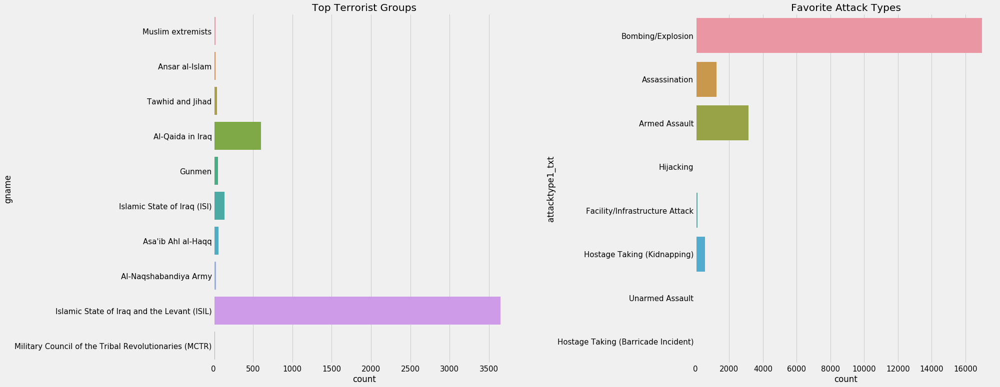

In [24]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_iraq=df[df['country_txt']=='Iraq']
iraq_groups=terror_iraq['gname'].value_counts()[1:11].index
iraq_groups=terror_iraq[terror_iraq['gname'].isin(iraq_groups)]
sns.countplot(y='gname',data=iraq_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_iraq,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### Syria: ISIL with Bombing/Explosion

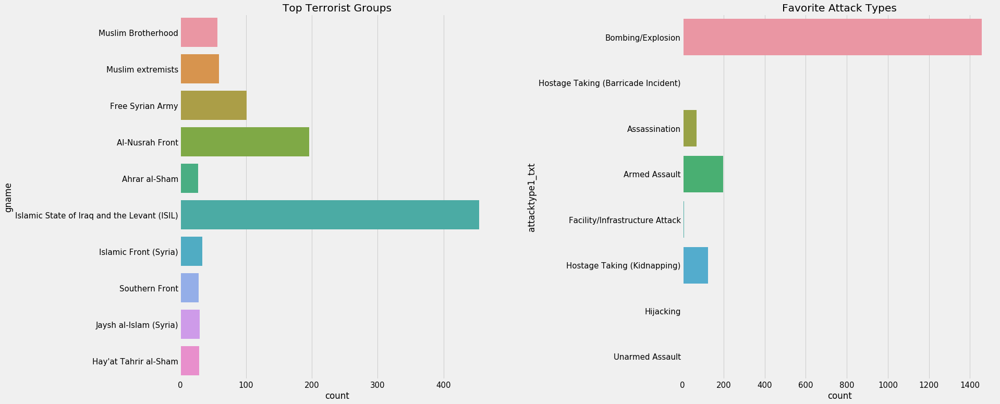

In [25]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_syria=df[df['country_txt']=='Syria']
syria_groups=terror_syria['gname'].value_counts()[1:11].index
syria_groups=terror_syria[terror_syria['gname'].isin(syria_groups)]
sns.countplot(y='gname',data=syria_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_syria,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### Afghanistan: Unknown with Bombing/Explosion

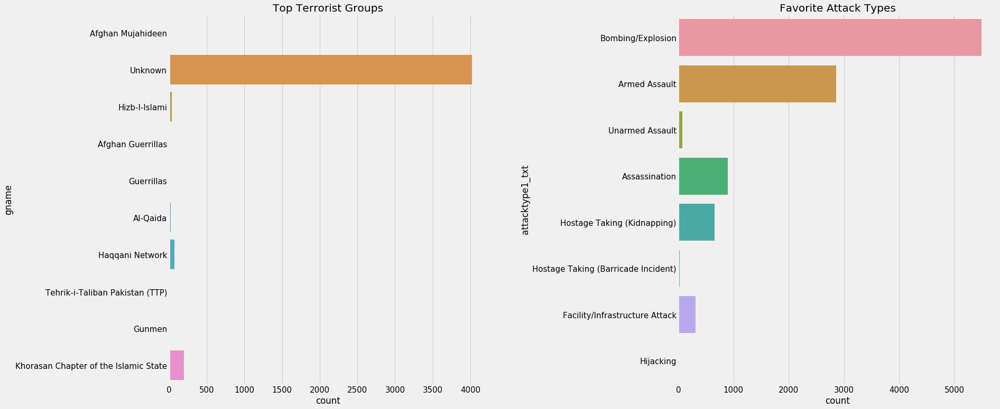

In [26]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_afghanistan=df[df['country_txt']=='Afghanistan']
afghanistan_groups=terror_afghanistan['gname'].value_counts()[1:11].index
afghanistan_groups=terror_afghanistan[terror_afghanistan['gname'].isin(afghanistan_groups)]
sns.countplot(y='gname',data=afghanistan_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_afghanistan,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### India: CPI-Maoist with Bombing/Explosion

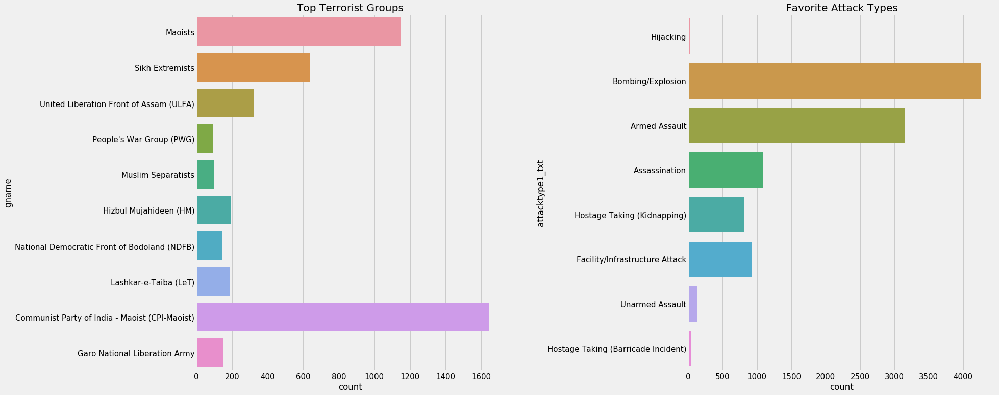

In [27]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_india=df[df['country_txt']=='India']
india_groups=terror_india['gname'].value_counts()[1:11].index
india_groups=terror_india[terror_india['gname'].isin(india_groups)]
sns.countplot(y='gname',data=india_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_india,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### Pakistan: TTP with Bombing/Explosion

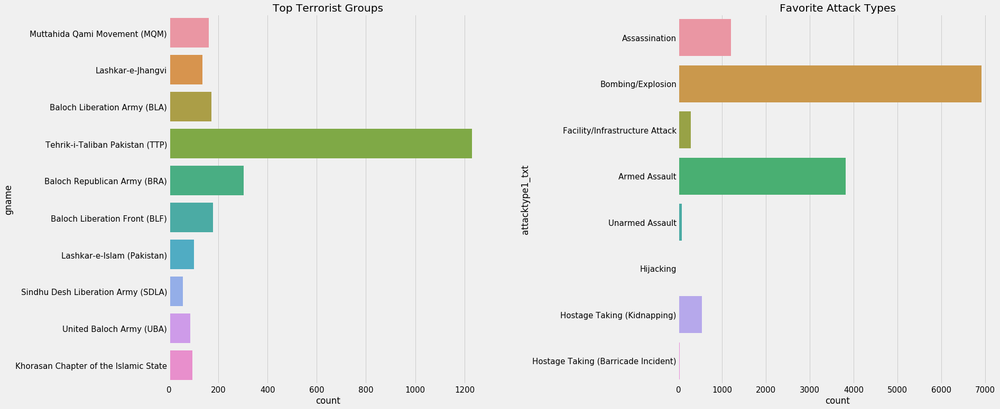

In [28]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_pakistan=df[df['country_txt']=='Pakistan']
pakistan_groups=terror_pakistan['gname'].value_counts()[1:11].index
pakistan_groups=terror_pakistan[terror_pakistan['gname'].isin(pakistan_groups)]
sns.countplot(y='gname',data=pakistan_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_pakistan,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

## Most Active Terrorist Groups and Most-Attacked Countries

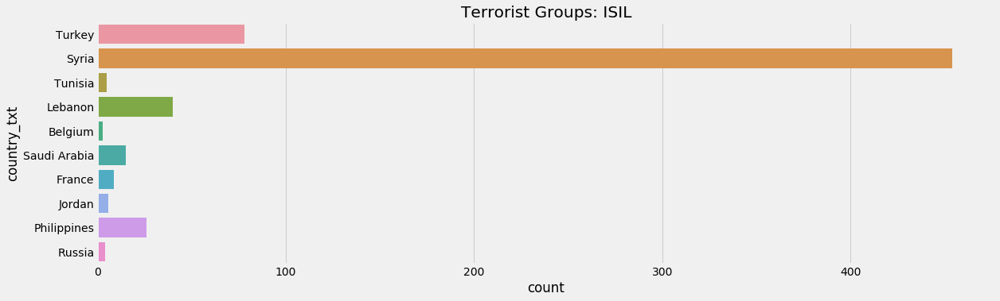

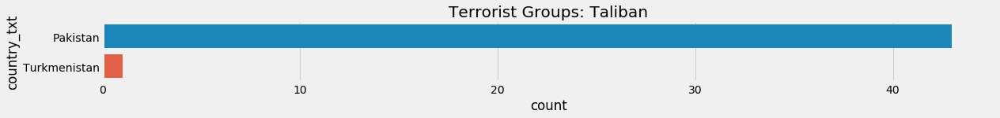

In [29]:
plt.figure(figsize=(18,12))
plt.subplot(2,1,1)
terror_ISIL=df[df['gname']=='Islamic State of Iraq and the Levant (ISIL)']
ISIL_groups=terror_ISIL['country_txt'].value_counts()[1:11].index
ISIL_groups=terror_ISIL[terror_ISIL['country_txt'].isin(ISIL_groups)]
sns.countplot(y='country_txt',data=ISIL_groups)
plt.title('Terrorist Groups: ISIL')
plt.subplots_adjust(hspace=0.3,wspace=0.6)


plt.figure(figsize=(18,3))
plt.subplot(2,1,2)
terror_Taliban=df[df['gname']=='Taliban']
Taliban_groups=terror_Taliban['country_txt'].value_counts()[1:11].index
Taliban_groups=terror_Taliban[terror_Taliban['country_txt'].isin(Taliban_groups)]
sns.countplot(y='country_txt',data=Taliban_groups)
plt.title('Terrorist Groups: Taliban')
plt.subplots_adjust(hspace=0.3,wspace=0.6)

plt.show()

## Terrorism over United States

In [32]:
target_codes = []
df_us = df[(df.country_txt == 'United States') & (df.provstate != 'Puerto Rico')]
for attack in df_us['targtype1_txt'].values:
    if attack in ['Business', 'Journalists & Media', 'NGO']:
        target_codes.append(1)
    elif attack in ['Government (General)', 'Government (Diplomatic)']:
        target_codes.append(2)
    elif attack == 'Abortion Related':
        target_codes.append(4)
    elif attack == 'Educational Institution':
        target_codes.append(5)
    elif attack == 'Police':
        target_codes.append(6)
    elif attack == 'Military':
        target_codes.append(7)
    elif attack == 'Religious Figures/Institutions':
        target_codes.append(8)
    elif attack in ['Airports & Aircraft', 'Maritime', 'Transportation']:
        target_codes.append(9)
    elif attack in ['Food or Water Supply', 'Telecommunication', 'Utilities']:
        target_codes.append(10)
    else:
        target_codes.append(3)

In [59]:
plt.figure(figsize=(8,8))
target_categories = ['Business', 'Government', 'Individuals', 'Healthcare', 'Education',
                     'Police', 'Military', 'Religion', 'Transportation', 'Infrastructure']

# terrorist attacks by target
target_count = np.asarray(df_us.groupby('targtype1_txt').targtype1_txt.count())
target_percent = np.round(target_count / sum(target_count) * 100, 2)

# terrorist attack fatalities by target
target_fatality = np.asarray(df_us.groupby('targtype1_txt')['nkill'].sum())
# target_yaxis = np.asarray([1.33, 2.36, 2.98, 0.81, 1.25, 1.71, 1.31, 1.53, 1.34, 0])
target_yaxis = np.asarray([1.34, 2.37, 2.99, 0.82, 1.26, 1.72, 1.32, 1.54, 1.35, 0])


# terrorist attack injuries by target
target_injury = np.asarray(df_us.groupby('targtype1_txt')['nwound'].sum())
target_xaxis = np.log10(target_injury)

target_text = []
for i in range(0, 10):
    target_text.append(target_categories[i] + ' (' + target_percent[i].astype(str) 
                       + '%)<br>' + target_fatality[i].astype(str) + ' Killed, '
                       + target_injury[i].astype(str) + ' Injured')

data = [go.Scatter(
        x = target_injury,
        y = target_fatality,
        text = target_text,
        mode = 'markers',
        hoverinfo = 'text',
        marker = dict(
            size = target_count / 5,
            opacity = 1,
            color = 'rgb(240, 140, 45)')
        )]


layout = go.Layout(
         title = 'Terrorist Attacks by Target over the United States (1970-2017)',
         xaxis = dict(
             title = 'number of wounds',
             type = 'log',
             range = [1.36, 3.26],
             tickmode = 'auto',
             nticks = 2,
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             title = 'number of kills',
             type = 'log',
             range = [0.59, 3.45],
             tickmode = 'auto',
             nticks = 4,
             showline = True,
             showgrid = False)
         )


figure = dict(data = data, layout = layout)

py.iplot(figure)

<Figure size 576x576 with 0 Axes>

# Prediction Model

we used logistic regression, random forest and svm for 'success' prediction.

'success' is a binary variable, if the terrorist attack succeeded, success=1, otherwise success=0.

## Verify Correlation Matrix

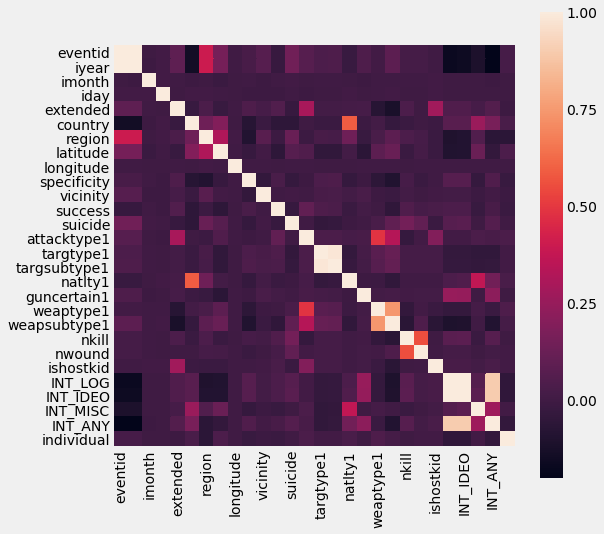

In [34]:
corrmat = df.corr()
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corrmat, vmax=1, square=True)

## Logistic Regression 

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

In [36]:
# drop null records
df = df.drop(['motive'],axis=1)
df = df.dropna(axis=0,how='any')

X = df[['country','region','attacktype1','individual','suicide','weaptype1','targtype1','guncertain1']]
y = df['success']

# split data set
X_tv, X_test, y_tv, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_val, X_train, y_val, y_train = train_test_split(X_tv,y_tv,test_size=0.2)

logreg = LogisticRegression(solver='lbfgs',multi_class='multinomial')
logreg.fit(X_train, y_train)


print('MSE on training set:', mean_squared_error(logreg.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(logreg.predict(X_val),y_val))

MSE on training set: 0.1001122229495932
MSE on validation set: 0.09687752072105774


In [37]:
y_pred = logreg.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
cfm
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.26      0.00      0.01      2678
          1       0.90      1.00      0.95     24054

avg / total       0.84      0.90      0.85     26732



## Random Forest

### Ensemble Random Forest Model

In [38]:
parameters = {
     'n_estimators':(5,10,15), #the number of trees
     'max_depth':(4,6,8,10),
     'min_samples_split': (4,6,8),
     'min_samples_leaf': (4,8,12,16),
}

RFC = GridSearchCV(RandomForestClassifier(),parameters,cv=3,iid=False)
RFC.fit(X_train, y_train)
par = RFC.best_params_
print('Parameters:',par)

Parameters: {'max_depth': 8, 'min_samples_leaf': 4, 'min_samples_split': 4, 'n_estimators': 15}


In [39]:
best_RFC = RandomForestClassifier(max_depth=par['max_depth'],min_samples_leaf=par['min_samples_split'],
                             min_samples_split=par['min_samples_split'],n_estimators=par['n_estimators'])
best_RFC.fit(X_train, y_train)

print('MSE on training set:', mean_squared_error(best_RFC.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(best_RFC.predict(X_val),y_val))

MSE on training set: 0.09188253997942579
MSE on validation set: 0.09197928478741188


In [40]:
y_pred = best_RFC.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.69      0.09      0.16      2678
          1       0.91      1.00      0.95     24054

avg / total       0.89      0.90      0.87     26732



### feature importance

Text(0.5, 0, 'Relative Importance')

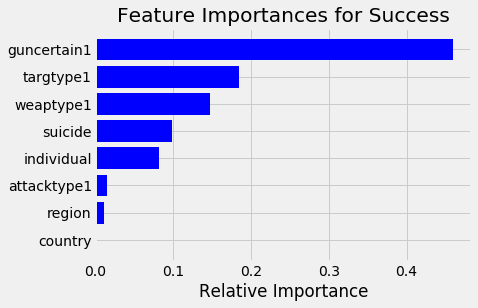

In [41]:
feature_names = [i for i in X.columns]
importances = best_RFC.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances for Success')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)),feature_names)
plt.xlabel('Relative Importance')

## SVM

In [42]:
clf = SVC(kernel='rbf',C=0.4)
clf.fit(X_train,y_train)

print('MSE on training set:', mean_squared_error(clf.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(clf.predict(X_val),y_val))

MSE on training set: 0.09646497708781446
MSE on validation set: 0.09404846798611192


In [43]:
y_pred = clf.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))    

             precision    recall  f1-score   support

          0       0.64      0.05      0.09      2678
          1       0.90      1.00      0.95     24054

avg / total       0.88      0.90      0.86     26732



## Model selection

- Logistic Regression: MSE on validation set is 0.09687752072105774
- Random Forest: MSE on validation set is 0.09197928478741188
- SVM MSE on validation set is 0.09404846798611192

Therefore we choose Random Forest for prediction.

In [44]:
final_X_train = pd.concat([X_train,X_val])
final_y_train = pd.concat([y_train,y_val])
best_RFC.fit(final_X_train,final_y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=4,
            min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [45]:
y_pred = best_RFC.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.70      0.11      0.19      2678
          1       0.91      0.99      0.95     24054

avg / total       0.89      0.91      0.87     26732

